In [1]:
import warnings
warnings.filterwarnings('ignore')

# ManifoldConvNet

In [2]:
# import the necessary packages
from keras.models import Model
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers.core import Activation
from keras.layers.core import Dropout
from keras.layers.core import Lambda
from keras.layers.core import Dense
from keras.layers import Flatten
from keras.layers import Input
import tensorflow as tf
import numpy as np

class ManifoldConvNet:
    @staticmethod
    def build_Clustering_branch(inputs, numClusters,
        finalAct="softmax"):
        # define a branch of output layers for the number of different
        # clothing categories (i.e., shirts, jeans, dresses, etc.)
        x = Flatten()(inputs)
        x = Dense(256)(x)
        x = Activation("relu")(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        x = Dense(numClusters)(x)
        x = Activation(finalAct, name="clustering_output")(x)

        # return the category prediction sub-network
        return x

    @staticmethod
    def build_Z_branch(inputs, numZ, finalAct="None"):
  
        # define a branch of output layers for the number of different
        # colors (i.e., red, black, blue, etc.)
        x = Flatten()(inputs)
        x = Dense(128)(x)
        x = Activation("relu")(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        x = Dense(numZ)(x)
        x = Activation(finalAct, name="Z_output")(x)

        # return the color prediction sub-network
        return x

    @staticmethod
    def build(width, height, numClusters, numZ,
        finalAct=['softmax', 'linear']):
        # initialize the input shape and channel dimension (this code
        # assumes you are using TensorFlow which utilizes channels
        # last ordering)
        inputShape = (height, width, 3)
        chanDim = -1

        # construct both the "category" and "color" sub-networks
        inputs = Input(shape=inputShape)
        # CONV => RELU => POOL
        x = Conv2D(32, (3, 3), padding="same")(inputs)
        x = Activation("relu")(x)
        x = BatchNormalization(axis=chanDim)(x)
        x = MaxPooling2D(pool_size=(3, 3))(x)
        x = Dropout(0.25)(x)

        # (CONV => RELU) * 2 => POOL
        x = Conv2D(64, (3, 3), padding="same")(x)
        x = Activation("relu")(x)
        x = BatchNormalization(axis=chanDim)(x)
        x = Conv2D(64, (3, 3), padding="same")(x)
        x = Activation("relu")(x)
        x = BatchNormalization(axis=chanDim)(x)
        x = MaxPooling2D(pool_size=(2, 2))(x)
        x = Dropout(0.25)(x)

        # (CONV => RELU) * 2 => POOL
        x = Conv2D(128, (3, 3), padding="same")(x)
        x = Activation("relu")(x)
        x = BatchNormalization(axis=chanDim)(x)
        x = Conv2D(128, (3, 3), padding="same")(x)
        x = Activation("relu")(x)
        x = BatchNormalization(axis=chanDim)(x)
        x = MaxPooling2D(pool_size=(2, 2))(x)
        x = Dropout(0.25)(x)
        
        ClusteringBranch = ManifoldConvNet.build_Clustering_branch(x, numClusters, finalAct=finalAct[0])
        Z_Branch = ManifoldConvNet.build_Z_branch(inputs, numZ, finalAct=finalAct[1])

        # create the model using our input (the batch of images) and
        # two separate outputs -- one for the clothing category
        # branch and another for the color branch, respectively
        model = Model(
            inputs=inputs,
            outputs=[ClusteringBranch, Z_Branch],
            name="ManifoldNet")

        # return the constructed network architecture
        return model

Using TensorFlow backend.


# MNIST

In [3]:
dataset_name = 'MNIST'
name = 'HDBSCAN'

In [4]:
import pickle
with open('./experiments/manifold generation/{}_{}.pkl'.format(dataset_name, name), 'rb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    embedding_Z_space = pickle.load(f)
    

In [5]:
X, y_cluster , Z = embedding_Z_space['X'], embedding_Z_space['y_cluster'], embedding_Z_space['Z']

In [6]:
# batch size, and image dimensions
EPOCHS = 50
INIT_LR = 1e-3
IMAGE_DIMS = X[0].shape

In [7]:
X.shape, y_cluster.shape, Z.shape

((68764, 28, 28, 3), (68764,), (68764, 2))

In [8]:
from sklearn.model_selection import train_test_split

In [9]:
# the data for training and the remaining 20% for testing
split = train_test_split(X, y_cluster, Z, test_size=0.25, random_state=42)

In [10]:
(trainX, testX, trainClustering, testClustering, trainZ, testZ) = split

In [11]:
import pandas as pd

In [12]:
trainClustering = pd.get_dummies(trainClustering)
testClustering = pd.get_dummies(testClustering)

In [13]:
# initialize our FashionNet multi-output network
model = ManifoldConvNet.build(IMAGE_DIMS[0], IMAGE_DIMS[1], numClusters=len(np.unique(y_cluster)), numZ=Z.shape[1], 
                         finalAct=['softmax', 'linear'])

In [14]:

#each output of the network along with a second dictionary that
# specifies the weight per loss
losses = { "clustering_output": "categorical_crossentropy", "Z_output": "mean_squared_error"}
lossWeights = {"clustering_output": 1.0, "Z_output": 1.0}

# initialize the optimizer and compile the model
from keras.optimizers import Adam
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(optimizer=opt, loss=losses, loss_weights=lossWeights, metrics=["accuracy"])

In [15]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 28, 28, 3)    0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 28, 28, 32)   896         input_1[0][0]                    
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 28, 28, 32)   0           conv2d_1[0][0]                   
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 28, 28, 32)   128         activation_1[0][0]               
__________________________________________________________________________________________________
max_poolin

In [16]:
trainX.shape, trainClustering.shape, trainZ.shape

((51573, 28, 28, 3), (51573, 56), (51573, 2))

In [17]:
# train the network to perform multi-output classification
H = model.fit(trainX,   {"clustering_output": trainClustering, "Z_output": trainZ},
validation_data=(testX, {"clustering_output": testClustering, "Z_output": testZ}), epochs=EPOCHS,verbose=1)

Train on 51573 samples, validate on 17191 samples
Epoch 1/50
51573/51573 [==============================] - 275s 5ms/step - loss: 1008.0305 - clustering_output_loss: 1.0679 - Z_output_loss: 1006.9626 - clustering_output_acc: 0.6730 - Z_output_acc: 0.8945 - val_loss: 471.0996 - val_clustering_output_loss: 0.4070 - val_Z_output_loss: 470.6926 - val_clustering_output_acc: 0.8479 - val_Z_output_acc: 0.9319
Epoch 2/50
51573/51573 [==============================] - 260s 5ms/step - loss: 633.7267 - clustering_output_loss: 0.5508 - Z_output_loss: 633.1759 - clustering_output_acc: 0.8070 - Z_output_acc: 0.9152 - val_loss: 392.9222 - val_clustering_output_loss: 0.3256 - val_Z_output_loss: 392.5966 - val_clustering_output_acc: 0.8748 - val_Z_output_acc: 0.9511
Epoch 3/50
51573/51573 [==============================] - 260s 5ms/step - loss: 607.4506 - clustering_output_loss: 0.4655 - Z_output_loss: 606.9851 - clustering_output_acc: 0.8355 - Z_output_acc: 0.9206 - val_loss: 377.5847 - val_clustering

Epoch 24/50
51573/51573 [==============================] - 263s 5ms/step - loss: 514.6726 - clustering_output_loss: 0.1704 - Z_output_loss: 514.5023 - clustering_output_acc: 0.9395 - Z_output_acc: 0.9272 - val_loss: 295.4936 - val_clustering_output_loss: 0.2092 - val_Z_output_loss: 295.2845 - val_clustering_output_acc: 0.9274 - val_Z_output_acc: 0.9602
Epoch 25/50
51573/51573 [==============================] - 262s 5ms/step - loss: 516.5234 - clustering_output_loss: 0.1673 - Z_output_loss: 516.3561 - clustering_output_acc: 0.9389 - Z_output_acc: 0.9280 - val_loss: 284.5192 - val_clustering_output_loss: 0.2025 - val_Z_output_loss: 284.3167 - val_clustering_output_acc: 0.9277 - val_Z_output_acc: 0.9585
Epoch 26/50
51573/51573 [==============================] - 262s 5ms/step - loss: 516.2096 - clustering_output_loss: 0.1592 - Z_output_loss: 516.0504 - clustering_output_acc: 0.9418 - Z_output_acc: 0.9263 - val_loss: 298.6251 - val_clustering_output_loss: 0.2176 - val_Z_output_loss: 298.407

In [18]:
import types
import tempfile
import keras.models

def make_keras_picklable():
    def __getstate__(self):
        model_str = ""
        with tempfile.NamedTemporaryFile(suffix='.hdf5', delete=True) as fd:
            keras.models.save_model(self, fd.name, overwrite=True)
            model_str = fd.read()
        d = { 'model_str': model_str }
        return d

    def __setstate__(self, state):
        with tempfile.NamedTemporaryFile(suffix='.hdf5', delete=True) as fd:
            fd.write(state['model_str'])
            fd.flush()
            model = keras.models.load_model(fd.name)
        self.__dict__ = model.__dict__


    cls = keras.models.Model
    cls.__getstate__ = __getstate__
    cls.__setstate__ = __setstate__

make_keras_picklable()

In [19]:
import pickle
with open('./experiments/Models/{} model.h5'.format(dataset_name), 'wb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    pickle.dump(H, f, pickle.HIGHEST_PROTOCOL)
    

In [20]:
import matplotlib.pyplot as plt

In [21]:
# plot the total loss, category loss, and color loss
lossNames = ["loss", "clustering_output_loss", "Z_output_loss"]

(fig, ax) = plt.subplots(3, 1, figsize=(13, 13), dpi=600)

# loop over the loss names
for (i, l) in enumerate(lossNames):
    # plot the loss for both the training and validation data
    title = "Loss for {}".format(l) if l != "loss" else "Total loss"
    ax[i].set_title(title)
    ax[i].set_xlabel("Epoch #")
    ax[i].set_ylabel("Loss")
    ax[i].plot(np.arange(0, EPOCHS), H.history[l], label=l)
    ax[i].plot(np.arange(0, EPOCHS), H.history["val_" + l],
        label="val_" + l)
    ax[i].legend()

# save the losses figure
plt.tight_layout()
plt.savefig('./experiments/manifold generation/{} losses.jpg'.format(dataset_name))
plt.show()


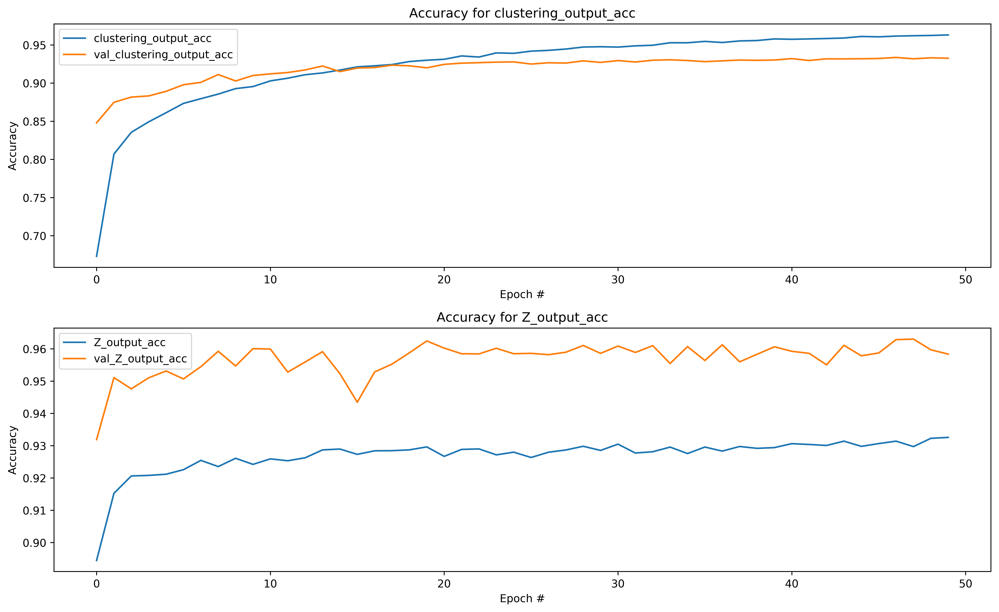

In [22]:
accuracyNames = ["clustering_output_acc", "Z_output_acc"]
(fig, ax) = plt.subplots(2, 1, figsize=(13, 8), dpi=600)

# loop over the accuracy names
for (i, l) in enumerate(accuracyNames):
    # plot the loss for both the training and validation data
    ax[i].set_title("Accuracy for {}".format(l))
    ax[i].set_xlabel("Epoch #")
    ax[i].set_ylabel("Accuracy")
    ax[i].plot(np.arange(0, EPOCHS), H.history[l], label=l)
    ax[i].plot(np.arange(0, EPOCHS), H.history["val_" + l],
        label="val_" + l)
    ax[i].legend()

# save the accuracies figure
plt.tight_layout()
plt.savefig('./experiments/manifold generation/{} Accuracies.jpg'.format(dataset_name))
plt.show()

# fashion MNIST

In [23]:
dataset_name = 'fashion MNIST'
name = 'HDBSCAN'

In [24]:
import pickle
with open('./experiments/manifold generation/{}_{}.pkl'.format(dataset_name, name), 'rb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    embedding_Z_space = pickle.load(f)
    

In [25]:
X, y_cluster , Z = embedding_Z_space['X'], embedding_Z_space['y_cluster'], embedding_Z_space['Z']

In [26]:
# batch size, and image dimensions
EPOCHS = 50
INIT_LR = 1e-3
IMAGE_DIMS = X[0].shape

In [27]:
X.shape, y_cluster.shape, Z.shape

((66884, 28, 28, 3), (66884,), (66884, 2))

In [28]:
# the data for training and the remaining 20% for testing
split = train_test_split(X, y_cluster, Z, test_size=0.25, random_state=42)

In [29]:
(trainX, testX, trainClustering, testClustering, trainZ, testZ) = split

In [30]:
trainClustering = pd.get_dummies(trainClustering)
testClustering = pd.get_dummies(testClustering)

In [31]:
# initialize our FashionNet multi-output network
model = ManifoldConvNet.build(IMAGE_DIMS[0], IMAGE_DIMS[1], numClusters=len(np.unique(y_cluster)), numZ=Z.shape[1], 
                         finalAct=['softmax', 'linear'])

In [32]:

#each output of the network along with a second dictionary that
# specifies the weight per loss
losses = { "clustering_output": "categorical_crossentropy", "Z_output": "mean_squared_error"}
lossWeights = {"clustering_output": 1.0, "Z_output": 1.0}

# initialize the optimizer and compile the model
from keras.optimizers import Adam
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(optimizer=opt, loss=losses, loss_weights=lossWeights, metrics=["accuracy"])

In [33]:
# train the network to perform multi-output classification
H = model.fit(trainX,   {"clustering_output": trainClustering, "Z_output": trainZ},
validation_data=(testX, {"clustering_output": testClustering, "Z_output": testZ}), epochs=EPOCHS,verbose=1)

Train on 50163 samples, validate on 16721 samples
Epoch 1/50
50163/50163 [==============================] - 255s 5ms/step - loss: 678.4607 - clustering_output_loss: 1.3929 - Z_output_loss: 677.0678 - clustering_output_acc: 0.5788 - Z_output_acc: 0.9479 - val_loss: 237.2401 - val_clustering_output_loss: 0.5293 - val_Z_output_loss: 236.7108 - val_clustering_output_acc: 0.8064 - val_Z_output_acc: 0.9651
Epoch 2/50
50163/50163 [==============================] - 251s 5ms/step - loss: 386.2243 - clustering_output_loss: 0.7025 - Z_output_loss: 385.5218 - clustering_output_acc: 0.7579 - Z_output_acc: 0.9461 - val_loss: 217.6294 - val_clustering_output_loss: 0.5093 - val_Z_output_loss: 217.1201 - val_clustering_output_acc: 0.8104 - val_Z_output_acc: 0.9642
Epoch 3/50
50163/50163 [==============================] - 252s 5ms/step - loss: 380.2133 - clustering_output_loss: 0.6156 - Z_output_loss: 379.5977 - clustering_output_acc: 0.7865 - Z_output_acc: 0.9437 - val_loss: 207.6994 - val_clustering_o

Epoch 24/50
50163/50163 [==============================] - 247s 5ms/step - loss: 350.4793 - clustering_output_loss: 0.2370 - Z_output_loss: 350.2424 - clustering_output_acc: 0.9154 - Z_output_acc: 0.9449 - val_loss: 167.3439 - val_clustering_output_loss: 0.2487 - val_Z_output_loss: 167.0952 - val_clustering_output_acc: 0.9099 - val_Z_output_acc: 0.9651
Epoch 25/50
50163/50163 [==============================] - 248s 5ms/step - loss: 348.5826 - clustering_output_loss: 0.2275 - Z_output_loss: 348.3551 - clustering_output_acc: 0.9170 - Z_output_acc: 0.9456 - val_loss: 172.4346 - val_clustering_output_loss: 0.2539 - val_Z_output_loss: 172.1806 - val_clustering_output_acc: 0.9105 - val_Z_output_acc: 0.9651
Epoch 26/50
50163/50163 [==============================] - 249s 5ms/step - loss: 340.2412 - clustering_output_loss: 0.2263 - Z_output_loss: 340.0148 - clustering_output_acc: 0.9185 - Z_output_acc: 0.9456 - val_loss: 164.0890 - val_clustering_output_loss: 0.2966 - val_Z_output_loss: 163.792

In [34]:
import pickle
with open('./experiments/Models/{} model.h5'.format(dataset_name), 'wb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    pickle.dump(H, f, pickle.HIGHEST_PROTOCOL)
    

In [35]:
# plot the total loss, category loss, and color loss
lossNames = ["loss", "clustering_output_loss", "Z_output_loss"]

(fig, ax) = plt.subplots(3, 1, figsize=(13, 13), dpi=600)

# loop over the loss names
for (i, l) in enumerate(lossNames):
    # plot the loss for both the training and validation data
    title = "{} Loss for {}".format(dataset_name, l) if l != "loss" else "{} Total loss".format(dataset_name)
    ax[i].set_title(title)
    ax[i].set_xlabel("Epoch #")
    ax[i].set_ylabel("Loss")
    ax[i].plot(np.arange(0, EPOCHS), H.history[l], label=l)
    ax[i].plot(np.arange(0, EPOCHS), H.history["val_" + l],
        label="val_" + l)
    ax[i].legend()
    for item in ([ax[i].title, ax[i].xaxis.label, ax[i].yaxis.label] + ax[i].get_xticklabels() + ax[i].get_yticklabels()):
        item.set_fontsize(16)

# save the losses figure
plt.tight_layout()
plt.savefig('./experiments/manifold generation/{} losses.jpg'.format(dataset_name))
plt.show()




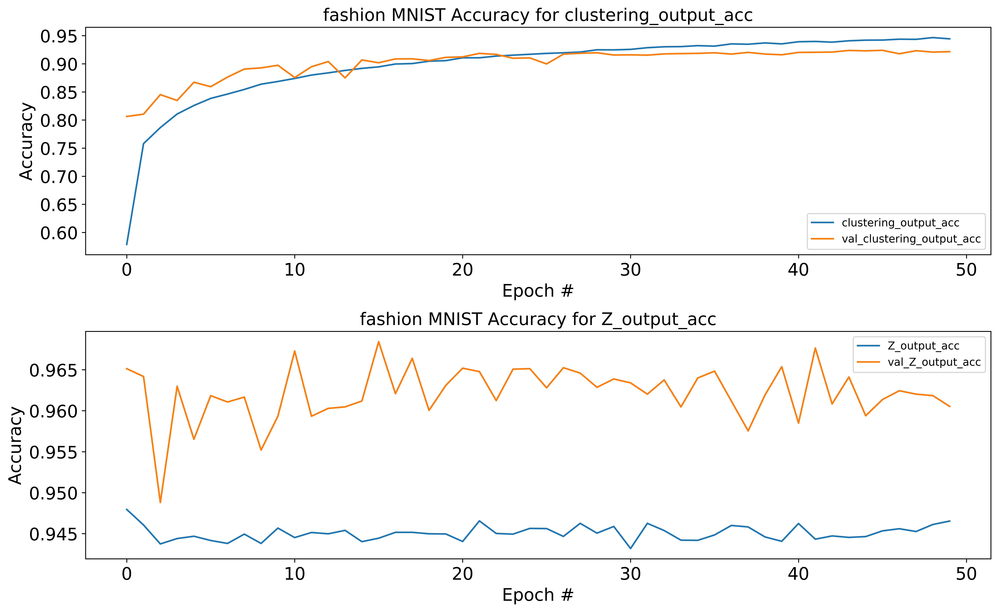

In [36]:
accuracyNames = ["clustering_output_acc", "Z_output_acc"]
(fig, ax) = plt.subplots(2, 1, figsize=(13, 8), dpi=600)

# loop over the accuracy names
for (i, l) in enumerate(accuracyNames):
    # plot the loss for both the training and validation data
    ax[i].set_title("{} Accuracy for {}".format(dataset_name, l))
    ax[i].set_xlabel("Epoch #")
    ax[i].set_ylabel("Accuracy")
    ax[i].plot(np.arange(0, EPOCHS), H.history[l], label=l)
    ax[i].plot(np.arange(0, EPOCHS), H.history["val_" + l],
        label="val_" + l)
    ax[i].legend()
    for item in ([ax[i].title, ax[i].xaxis.label, ax[i].yaxis.label] + ax[i].get_xticklabels() + ax[i].get_yticklabels()):
        item.set_fontsize(16)
        
# save the accuracies figure
plt.tight_layout()
plt.savefig('./experiments/manifold generation/{} Accuracies.jpg'.format(dataset_name))
plt.show()

# SmallNORB

In [37]:
dataset_name = 'SmallNORB'
name = 'HDBSCAN'

In [38]:
import pickle
with open('./experiments/manifold generation/{}_{}.pkl'.format(dataset_name, name), 'rb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    embedding_Z_space = pickle.load(f)
    

In [39]:
X, y_cluster , Z = embedding_Z_space['X'], embedding_Z_space['y_cluster'], embedding_Z_space['Z']

In [40]:
# batch size, and image dimensions
EPOCHS = 50
INIT_LR = 1e-3
IMAGE_DIMS = X[0].shape

In [41]:
# the data for training and the remaining 20% for testing
split = train_test_split(X, y_cluster, Z, test_size=0.25, random_state=42)

In [42]:
(trainX, testX, trainClustering, testClustering, trainZ, testZ) = split

In [43]:
trainClustering = pd.get_dummies(trainClustering)
testClustering = pd.get_dummies(testClustering)

In [44]:
# initialize our FashionNet multi-output network
model = ManifoldConvNet.build(IMAGE_DIMS[0], IMAGE_DIMS[1], numClusters=len(np.unique(y_cluster)), numZ=Z.shape[1], 
                         finalAct=['softmax', 'linear'])

In [45]:

#each output of the network along with a second dictionary that
# specifies the weight per loss
losses = { "clustering_output": "categorical_crossentropy", "Z_output": "mean_squared_error"}
lossWeights = {"clustering_output": 1.0, "Z_output": 1.0}

# initialize the optimizer and compile the model
from keras.optimizers import Adam
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(optimizer=opt, loss=losses, loss_weights=lossWeights, metrics=["accuracy"])

In [46]:
# train the network to perform multi-output classification
H = model.fit(trainX,   {"clustering_output": trainClustering, "Z_output": trainZ},
validation_data=(testX, {"clustering_output": testClustering, "Z_output": testZ}), epochs=EPOCHS,verbose=1)

Train on 68759 samples, validate on 22920 samples
Epoch 1/50
68759/68759 [==============================] - 455s 7ms/step - loss: 2057.5256 - clustering_output_loss: 2.2667 - Z_output_loss: 2055.2589 - clustering_output_acc: 0.4754 - Z_output_acc: 0.8358 - val_loss: 6179.5373 - val_clustering_output_loss: 0.5607 - val_Z_output_loss: 6178.9766 - val_clustering_output_acc: 0.8316 - val_Z_output_acc: 0.8162
Epoch 2/50
68759/68759 [==============================] - 452s 7ms/step - loss: 1731.3975 - clustering_output_loss: 0.7718 - Z_output_loss: 1730.6257 - clustering_output_acc: 0.7615 - Z_output_acc: 0.8358 - val_loss: 2398.9239 - val_clustering_output_loss: 0.3477 - val_Z_output_loss: 2398.5762 - val_clustering_output_acc: 0.8873 - val_Z_output_acc: 0.7293
Epoch 3/50
68759/68759 [==============================] - 451s 7ms/step - loss: 1814.1021 - clustering_output_loss: 0.5660 - Z_output_loss: 1813.5361 - clustering_output_acc: 0.8211 - Z_output_acc: 0.8280 - val_loss: 1730.5574 - val_c

Epoch 24/50
68759/68759 [==============================] - 453s 7ms/step - loss: 2000.4516 - clustering_output_loss: 0.1446 - Z_output_loss: 2000.3070 - clustering_output_acc: 0.9532 - Z_output_acc: 0.8031 - val_loss: 3545.0330 - val_clustering_output_loss: 0.0696 - val_Z_output_loss: 3544.9634 - val_clustering_output_acc: 0.9752 - val_Z_output_acc: 0.6081
Epoch 25/50
68759/68759 [==============================] - 451s 7ms/step - loss: 1998.0537 - clustering_output_loss: 0.1387 - Z_output_loss: 1997.9150 - clustering_output_acc: 0.9537 - Z_output_acc: 0.8069 - val_loss: 1978.4456 - val_clustering_output_loss: 0.1114 - val_Z_output_loss: 1978.3342 - val_clustering_output_acc: 0.9634 - val_Z_output_acc: 0.8603
Epoch 26/50
68759/68759 [==============================] - 452s 7ms/step - loss: 1987.6313 - clustering_output_loss: 0.1338 - Z_output_loss: 1987.4974 - clustering_output_acc: 0.9563 - Z_output_acc: 0.8080 - val_loss: 1628.6201 - val_clustering_output_loss: 0.1468 - val_Z_output_lo

Epoch 47/50
68759/68759 [==============================] - 452s 7ms/step - loss: 1987.9723 - clustering_output_loss: 0.0875 - Z_output_loss: 1987.8847 - clustering_output_acc: 0.9709 - Z_output_acc: 0.8081 - val_loss: 1860.9021 - val_clustering_output_loss: 0.1302 - val_Z_output_loss: 1860.7719 - val_clustering_output_acc: 0.9612 - val_Z_output_acc: 0.8504
Epoch 48/50
68759/68759 [==============================] - 453s 7ms/step - loss: 1981.2811 - clustering_output_loss: 0.0871 - Z_output_loss: 1981.1941 - clustering_output_acc: 0.9711 - Z_output_acc: 0.8074 - val_loss: 1778.3299 - val_clustering_output_loss: 0.0716 - val_Z_output_loss: 1778.2583 - val_clustering_output_acc: 0.9767 - val_Z_output_acc: 0.7410
Epoch 49/50
68759/68759 [==============================] - 454s 7ms/step - loss: 1988.7363 - clustering_output_loss: 0.0862 - Z_output_loss: 1988.6501 - clustering_output_acc: 0.9716 - Z_output_acc: 0.8064 - val_loss: 1755.7305 - val_clustering_output_loss: 0.0604 - val_Z_output_lo

In [47]:
import pickle
with open('./experiments/Models/{} model.h5'.format(dataset_name), 'wb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    pickle.dump(H, f, pickle.HIGHEST_PROTOCOL)
    

In [48]:
# plot the total loss, category loss, and color loss
lossNames = ["loss", "clustering_output_loss", "Z_output_loss"]

(fig, ax) = plt.subplots(3, 1, figsize=(13, 13), dpi=600)

# loop over the loss names
for (i, l) in enumerate(lossNames):
    # plot the loss for both the training and validation data
    title = "{} Loss for {}".format(dataset_name, l) if l != "loss" else "{} Total loss".format(dataset_name)
    ax[i].set_title(title)
    ax[i].set_xlabel("Epoch #")
    ax[i].set_ylabel("Loss")
    ax[i].plot(np.arange(0, EPOCHS), H.history[l], label=l)
    ax[i].plot(np.arange(0, EPOCHS), H.history["val_" + l],
        label="val_" + l)
    ax[i].legend()
    for item in ([ax[i].title, ax[i].xaxis.label, ax[i].yaxis.label] + ax[i].get_xticklabels() + ax[i].get_yticklabels()):
        item.set_fontsize(16)

# save the losses figure
plt.tight_layout()
plt.savefig('./experiments/manifold generation/{} losses.jpg'.format(dataset_name))
plt.show()




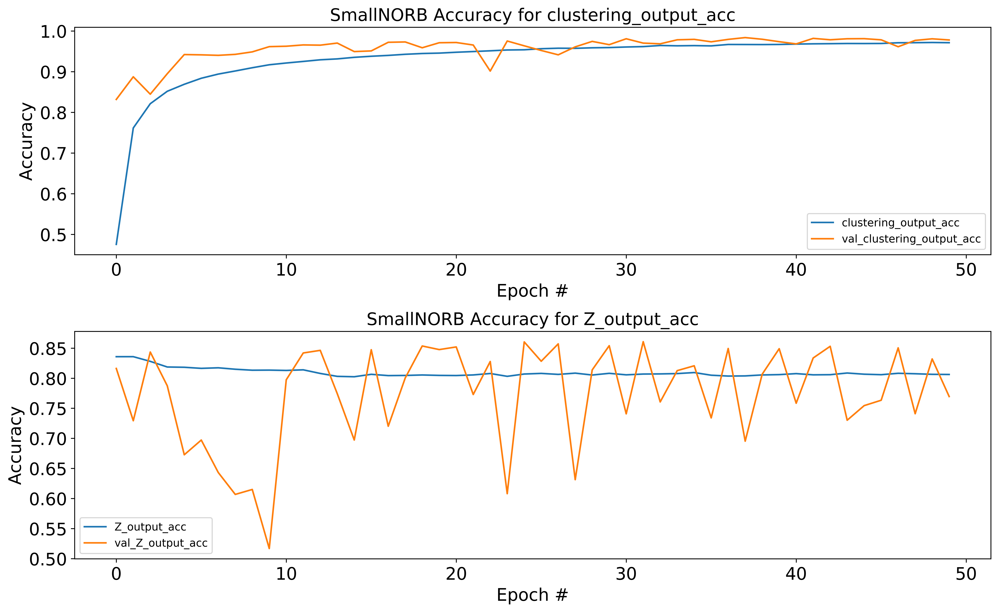

In [49]:
accuracyNames = ["clustering_output_acc", "Z_output_acc"]
(fig, ax) = plt.subplots(2, 1, figsize=(13, 8), dpi=600)

# loop over the accuracy names
for (i, l) in enumerate(accuracyNames):
    # plot the loss for both the training and validation data
    ax[i].set_title("{} Accuracy for {}".format(dataset_name, l))
    ax[i].set_xlabel("Epoch #")
    ax[i].set_ylabel("Accuracy")
    ax[i].plot(np.arange(0, EPOCHS), H.history[l], label=l)
    ax[i].plot(np.arange(0, EPOCHS), H.history["val_" + l],
        label="val_" + l)
    ax[i].legend()
    for item in ([ax[i].title, ax[i].xaxis.label, ax[i].yaxis.label] + ax[i].get_xticklabels() + ax[i].get_yticklabels()):
        item.set_fontsize(16)
        
# save the accuracies figure
plt.tight_layout()
plt.savefig('./experiments/manifold generation/{} Accuracies.jpg'.format(dataset_name))
plt.show()

# CIFAR10

In [50]:
dataset_name = 'CIFAR10'
name = 'HDBSCAN'

In [51]:
import pickle
with open('./experiments/manifold generation/{}_{}.pkl'.format(dataset_name, name), 'rb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    embedding_Z_space = pickle.load(f)
    

In [52]:
X, y_cluster , Z = embedding_Z_space['X'], embedding_Z_space['y_cluster'], embedding_Z_space['Z']

In [53]:
# batch size, and image dimensions
EPOCHS = 50
INIT_LR = 1e-3
IMAGE_DIMS = X[0].shape

In [54]:
# the data for training and the remaining 20% for testing
split = train_test_split(X, y_cluster, Z, test_size=0.25, random_state=42)

In [55]:
(trainX, testX, trainClustering, testClustering, trainZ, testZ) = split

In [56]:
trainClustering = pd.get_dummies(trainClustering)
testClustering = pd.get_dummies(testClustering)

In [57]:
# initialize our FashionNet multi-output network
model = ManifoldConvNet.build(IMAGE_DIMS[0], IMAGE_DIMS[1], numClusters=len(np.unique(y_cluster)), numZ=Z.shape[1], 
                         finalAct=['softmax', 'linear'])

In [58]:

#each output of the network along with a second dictionary that
# specifies the weight per loss
losses = { "clustering_output": "categorical_crossentropy", "Z_output": "mean_squared_error"}
lossWeights = {"clustering_output": 1.0, "Z_output": 1.0}

# initialize the optimizer and compile the model
from keras.optimizers import Adam
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(optimizer=opt, loss=losses, loss_weights=lossWeights, metrics=["accuracy"])

In [59]:
# train the network to perform multi-output classification
H = model.fit(trainX,   {"clustering_output": trainClustering, "Z_output": trainZ},
validation_data=(testX, {"clustering_output": testClustering, "Z_output": testZ}), epochs=EPOCHS,verbose=1)

Train on 37906 samples, validate on 12636 samples
Epoch 1/50
37906/37906 [==============================] - 248s 7ms/step - loss: 794.2389 - clustering_output_loss: 1.8021 - Z_output_loss: 792.4368 - clustering_output_acc: 0.4775 - Z_output_acc: 0.8359 - val_loss: 408.2468 - val_clustering_output_loss: 1.1463 - val_Z_output_loss: 407.1005 - val_clustering_output_acc: 0.6159 - val_Z_output_acc: 0.8449
Epoch 2/50
37906/37906 [==============================] - 245s 6ms/step - loss: 490.8249 - clustering_output_loss: 1.2543 - Z_output_loss: 489.5707 - clustering_output_acc: 0.5909 - Z_output_acc: 0.8302 - val_loss: 369.2854 - val_clustering_output_loss: 0.9729 - val_Z_output_loss: 368.3125 - val_clustering_output_acc: 0.6616 - val_Z_output_acc: 0.8412
Epoch 3/50
37906/37906 [==============================] - 246s 7ms/step - loss: 480.0183 - clustering_output_loss: 1.1295 - Z_output_loss: 478.8888 - clustering_output_acc: 0.6272 - Z_output_acc: 0.8321 - val_loss: 367.0485 - val_clustering_o

Epoch 24/50
37906/37906 [==============================] - 244s 6ms/step - loss: 472.4738 - clustering_output_loss: 0.5693 - Z_output_loss: 471.9046 - clustering_output_acc: 0.8027 - Z_output_acc: 0.8325 - val_loss: 360.3914 - val_clustering_output_loss: 0.5764 - val_Z_output_loss: 359.8149 - val_clustering_output_acc: 0.7935 - val_Z_output_acc: 0.8378
Epoch 25/50
37906/37906 [==============================] - 244s 6ms/step - loss: 471.8527 - clustering_output_loss: 0.5511 - Z_output_loss: 471.3016 - clustering_output_acc: 0.8064 - Z_output_acc: 0.8332 - val_loss: 353.7111 - val_clustering_output_loss: 0.5651 - val_Z_output_loss: 353.1461 - val_clustering_output_acc: 0.7948 - val_Z_output_acc: 0.8457
Epoch 26/50
37906/37906 [==============================] - 246s 6ms/step - loss: 471.3475 - clustering_output_loss: 0.5454 - Z_output_loss: 470.8022 - clustering_output_acc: 0.8081 - Z_output_acc: 0.8335 - val_loss: 352.6227 - val_clustering_output_loss: 0.5303 - val_Z_output_loss: 352.092

In [60]:
import pickle
with open('./experiments/Models/{} model.h5'.format(dataset_name), 'wb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    pickle.dump(H, f, pickle.HIGHEST_PROTOCOL)
    

In [61]:
# plot the total loss, category loss, and color loss
lossNames = ["loss", "clustering_output_loss", "Z_output_loss"]

(fig, ax) = plt.subplots(3, 1, figsize=(13, 13), dpi=600)

# loop over the loss names
for (i, l) in enumerate(lossNames):
    # plot the loss for both the training and validation data
    title = "{} Loss for {}".format(dataset_name, l) if l != "loss" else "{} Total loss".format(dataset_name)
    ax[i].set_title(title)
    ax[i].set_xlabel("Epoch #")
    ax[i].set_ylabel("Loss")
    ax[i].plot(np.arange(0, EPOCHS), H.history[l], label=l)
    ax[i].plot(np.arange(0, EPOCHS), H.history["val_" + l],
        label="val_" + l)
    ax[i].legend()
    for item in ([ax[i].title, ax[i].xaxis.label, ax[i].yaxis.label] + ax[i].get_xticklabels() + ax[i].get_yticklabels()):
        item.set_fontsize(16)

# save the losses figure
plt.tight_layout()
plt.savefig('./experiments/manifold generation/{} losses.jpg'.format(dataset_name))
plt.show()



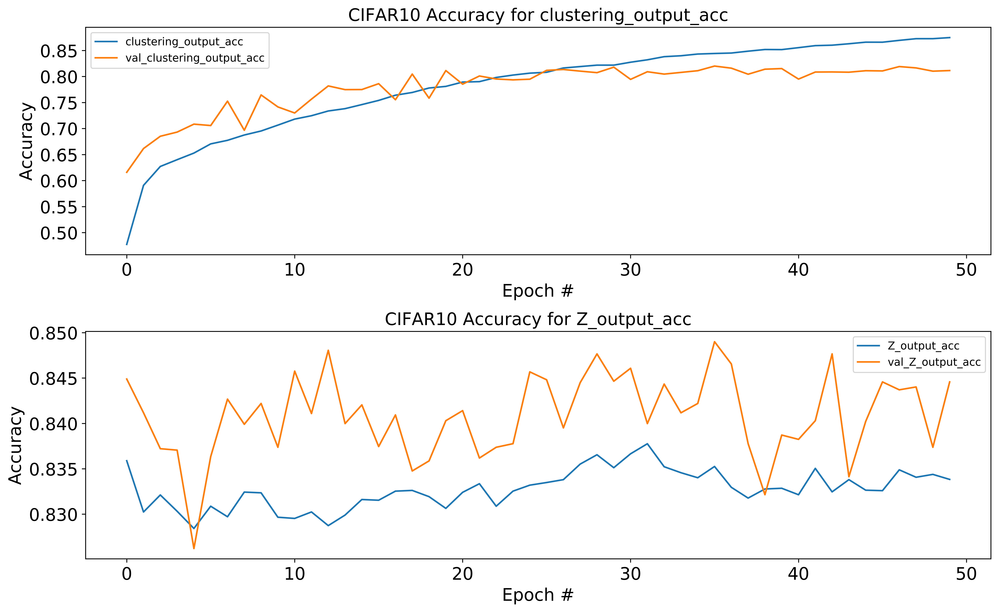

In [62]:
accuracyNames = ["clustering_output_acc", "Z_output_acc"]
(fig, ax) = plt.subplots(2, 1, figsize=(13, 8), dpi=600)

# loop over the accuracy names
for (i, l) in enumerate(accuracyNames):
    # plot the loss for both the training and validation data
    ax[i].set_title("{} Accuracy for {}".format(dataset_name, l))
    ax[i].set_xlabel("Epoch #")
    ax[i].set_ylabel("Accuracy")
    ax[i].plot(np.arange(0, EPOCHS), H.history[l], label=l)
    ax[i].plot(np.arange(0, EPOCHS), H.history["val_" + l],
        label="val_" + l)
    ax[i].legend()
    for item in ([ax[i].title, ax[i].xaxis.label, ax[i].yaxis.label] + ax[i].get_xticklabels() + ax[i].get_yticklabels()):
        item.set_fontsize(16)
        
# save the accuracies figure
plt.tight_layout()
plt.savefig('./experiments/manifold generation/{} Accuracies.jpg'.format(dataset_name))
plt.show()

# CIFAR100

In [63]:
dataset_name = 'CIFAR100'
name = 'HDBSCAN'

In [64]:
import pickle
with open('./experiments/manifold generation/{}_{}.pkl'.format(dataset_name, name), 'rb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    embedding_Z_space = pickle.load(f)
    

In [65]:
X, y_cluster, Z = embedding_Z_space['X'], embedding_Z_space['y_cluster'], embedding_Z_space['Z']

In [66]:
# batch size, and image dimensions
EPOCHS = 50
INIT_LR = 1e-3
IMAGE_DIMS = X[0].shape

In [67]:
# the data for training and the remaining 20% for testing
split = train_test_split(X, y_cluster, Z, test_size=0.25, random_state=42)

In [68]:
(trainX, testX, trainClustering, testClustering, trainZ, testZ) = split

In [69]:
trainClustering = pd.get_dummies(trainClustering)
testClustering = pd.get_dummies(testClustering)

In [70]:
# initialize our FashionNet multi-output network
model = ManifoldConvNet.build(IMAGE_DIMS[0], IMAGE_DIMS[1], numClusters=len(np.unique(y_cluster)), numZ=Z.shape[1], 
                         finalAct=['softmax', 'linear'])

In [71]:

#each output of the network along with a second dictionary that
# specifies the weight per loss
losses = { "clustering_output": "categorical_crossentropy", "Z_output": "mean_squared_error"}
lossWeights = {"clustering_output": 1.0, "Z_output": 1.0}

# initialize the optimizer and compile the model
from keras.optimizers import Adam
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(optimizer=opt, loss=losses, loss_weights=lossWeights, metrics=["accuracy"])

In [72]:
# train the network to perform multi-output classification
H = model.fit(trainX,   {"clustering_output": trainClustering, "Z_output": trainZ},
validation_data=(testX, {"clustering_output": testClustering, "Z_output": testZ}), epochs=EPOCHS,verbose=1)

Train on 38264 samples, validate on 12755 samples
Epoch 1/50
38264/38264 [==============================] - 251s 7ms/step - loss: 722.9876 - clustering_output_loss: 1.9487 - Z_output_loss: 721.0388 - clustering_output_acc: 0.4488 - Z_output_acc: 0.8927 - val_loss: 354.0154 - val_clustering_output_loss: 1.5314 - val_Z_output_loss: 352.4840 - val_clustering_output_acc: 0.4978 - val_Z_output_acc: 0.9077
Epoch 2/50
38264/38264 [==============================] - 247s 6ms/step - loss: 457.8510 - clustering_output_loss: 1.3419 - Z_output_loss: 456.5091 - clustering_output_acc: 0.5703 - Z_output_acc: 0.8943 - val_loss: 341.2007 - val_clustering_output_loss: 1.0278 - val_Z_output_loss: 340.1728 - val_clustering_output_acc: 0.6471 - val_Z_output_acc: 0.9069
Epoch 3/50
38264/38264 [==============================] - 247s 6ms/step - loss: 453.4996 - clustering_output_loss: 1.2157 - Z_output_loss: 452.2839 - clustering_output_acc: 0.6005 - Z_output_acc: 0.8965 - val_loss: 338.7277 - val_clustering_o

Epoch 24/50
38264/38264 [==============================] - 248s 6ms/step - loss: 435.6460 - clustering_output_loss: 0.5947 - Z_output_loss: 435.0513 - clustering_output_acc: 0.7949 - Z_output_acc: 0.8971 - val_loss: 333.9919 - val_clustering_output_loss: 0.5841 - val_Z_output_loss: 333.4077 - val_clustering_output_acc: 0.7870 - val_Z_output_acc: 0.9077
Epoch 25/50
38264/38264 [==============================] - 247s 6ms/step - loss: 432.8252 - clustering_output_loss: 0.5782 - Z_output_loss: 432.2470 - clustering_output_acc: 0.8001 - Z_output_acc: 0.8997 - val_loss: 345.3332 - val_clustering_output_loss: 0.5469 - val_Z_output_loss: 344.7863 - val_clustering_output_acc: 0.8025 - val_Z_output_acc: 0.9060
Epoch 26/50
38264/38264 [==============================] - 247s 6ms/step - loss: 435.2825 - clustering_output_loss: 0.5748 - Z_output_loss: 434.7077 - clustering_output_acc: 0.8017 - Z_output_acc: 0.8970 - val_loss: 327.1438 - val_clustering_output_loss: 0.5805 - val_Z_output_loss: 326.563

In [73]:
import types
import tempfile
import keras.models

def make_keras_picklable():
    def __getstate__(self):
        model_str = ""
        with tempfile.NamedTemporaryFile(suffix='.hdf5', delete=True) as fd:
            keras.models.save_model(self, fd.name, overwrite=True)
            model_str = fd.read()
        d = { 'model_str': model_str }
        return d

    def __setstate__(self, state):
        with tempfile.NamedTemporaryFile(suffix='.hdf5', delete=True) as fd:
            fd.write(state['model_str'])
            fd.flush()
            model = keras.models.load_model(fd.name)
        self.__dict__ = model.__dict__


    cls = keras.models.Model
    cls.__getstate__ = __getstate__
    cls.__setstate__ = __setstate__

make_keras_picklable()

In [74]:
import pickle
with open('./experiments/Models/{} model.h5'.format(dataset_name), 'wb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    pickle.dump(H, f, pickle.HIGHEST_PROTOCOL)
    

In [75]:
# plot the total loss, category loss, and color loss
lossNames = ["loss", "clustering_output_loss", "Z_output_loss"]

(fig, ax) = plt.subplots(3, 1, figsize=(13, 13), dpi=600)

# loop over the loss names
for (i, l) in enumerate(lossNames):
    # plot the loss for both the training and validation data
    title = "{} Loss for {}".format(dataset_name, l) if l != "loss" else "{} Total loss".format(dataset_name)
    ax[i].set_title(title)
    ax[i].set_xlabel("Epoch #")
    ax[i].set_ylabel("Loss")
    ax[i].plot(np.arange(0, EPOCHS), H.history[l], label=l)
    ax[i].plot(np.arange(0, EPOCHS), H.history["val_" + l],
        label="val_" + l)
    ax[i].legend()
    for item in ([ax[i].title, ax[i].xaxis.label, ax[i].yaxis.label] + ax[i].get_xticklabels() + ax[i].get_yticklabels()):
        item.set_fontsize(16)

# save the losses figure
plt.tight_layout()
plt.savefig('./experiments/manifold generation/{} losses.jpg'.format(dataset_name))
plt.show()


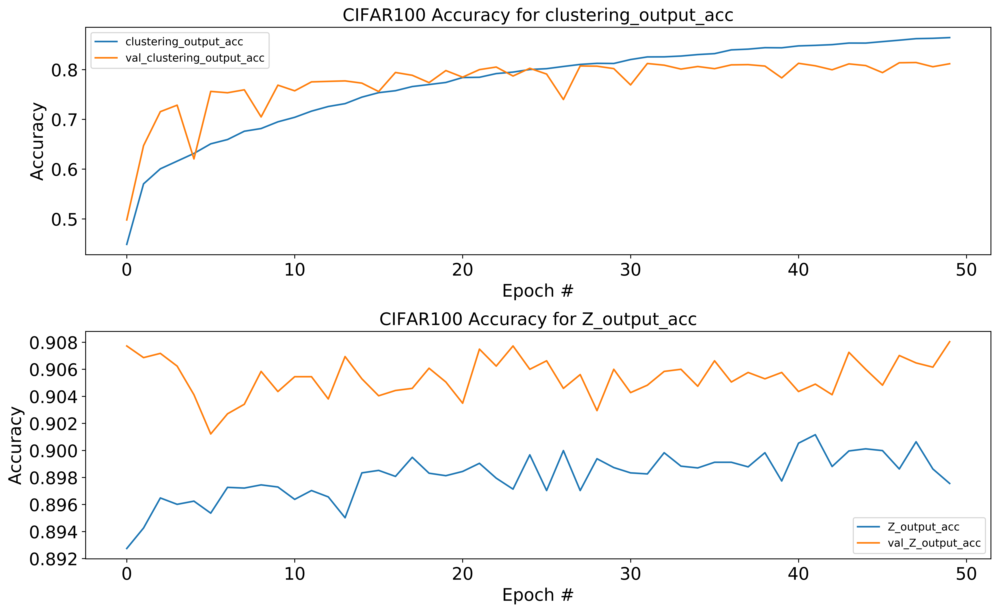

In [76]:
accuracyNames = ["clustering_output_acc", "Z_output_acc"]
(fig, ax) = plt.subplots(2, 1, figsize=(13, 8), dpi=600)

# loop over the accuracy names
for (i, l) in enumerate(accuracyNames):
    # plot the loss for both the training and validation data
    ax[i].set_title("{} Accuracy for {}".format(dataset_name, l))
    ax[i].set_xlabel("Epoch #")
    ax[i].set_ylabel("Accuracy")
    ax[i].plot(np.arange(0, EPOCHS), H.history[l], label=l)
    ax[i].plot(np.arange(0, EPOCHS), H.history["val_" + l],
        label="val_" + l)
    ax[i].legend()
    for item in ([ax[i].title, ax[i].xaxis.label, ax[i].yaxis.label] + ax[i].get_xticklabels() + ax[i].get_yticklabels()):
        item.set_fontsize(16)
        
# save the accuracies figure
plt.tight_layout()
plt.savefig('./experiments/manifold generation/{} Accuracies.jpg'.format(dataset_name))
plt.show()